In [1]:
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = ad.read_h5ad("/oscar/home/schang59/scratch/Zhuang-ABCA-2-preprocessed.h5ad")

In [3]:
# relabel slices
unique_values = sorted(adata.obs['brain_section_label'].unique())
value_to_label = {val: idx for idx, val in enumerate(unique_values)}
adata.obs['slice'] = adata.obs['brain_section_label'].map(value_to_label).astype(int)

In [4]:
def preprocess_multislice(adata, slice_col="slice_id",
                          min_genes_per_cell=100,
                          min_cells_per_gene=40000,
                          target_sum=1e4, max_scale=10):
    # qc
    sc.pp.calculate_qc_metrics(adata, percent_top=None, inplace=True)

    keep = np.ones(adata.n_obs, dtype=bool)
    for s in adata.obs[slice_col].unique():
        mask = (adata.obs[slice_col] == s).values
        n_genes = adata.obs.loc[mask, 'n_genes_by_counts'].values

        median = np.median(n_genes)
        mad = np.median(np.abs(n_genes - median))
        lower = max(median - 3 * mad, min_genes_per_cell)

        keep[mask] &= (n_genes >= lower)

    print(f"Cell QC: {adata.n_obs} → {keep.sum()} cells")
    adata = adata[keep].copy()

    # genes filter
    sc.pp.filter_genes(adata, min_cells=min_cells_per_gene)
    print(f"Gene filter: {adata.n_vars} genes retained "
          f"(detected in ≥{min_cells_per_gene} cells globally)")

    adata.layers['counts'] = adata.X.copy()

    # per slice norm
    for s in adata.obs[slice_col].unique():
        idx = np.where(adata.obs[slice_col] == s)[0]
        subset = adata[idx].copy()
        sc.pp.normalize_total(subset, target_sum=target_sum)
        sc.pp.log1p(subset)
        adata.X[idx] = subset.X

    print(f"Final: {adata.n_obs} cells × {adata.n_vars} genes")
    return adata
    
adata = preprocess_multislice(adata, slice_col="slice")

Cell QC: 1227408 → 468455 cells
Gene filter: 577 genes retained (detected in ≥40000 cells globally)
Final: 468455 cells × 577 genes


In [5]:
adata.layers['logcounts'] = adata.X.copy()
adata.X = adata.layers['counts']
sc.pp.highly_variable_genes(
    adata, 
    n_top_genes=100, 
    flavor="seurat_v3", 
)
adata = adata[:, adata.var["highly_variable"] == True].copy()

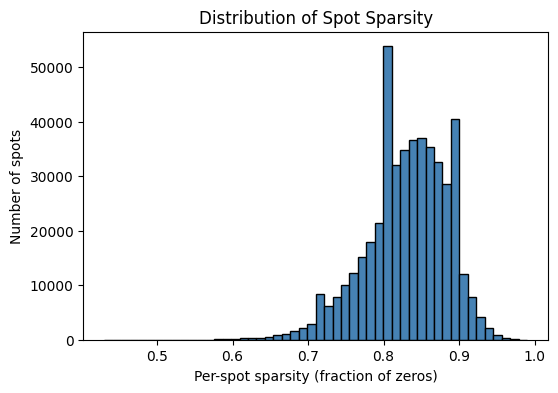

In [6]:
X = adata.X
if hasattr(X, "toarray"):
    X = X.toarray()
sparsity = np.mean(X == 0, axis=1)
plt.figure(figsize=(6,4))
plt.hist(sparsity, bins=50, color="steelblue", edgecolor="black")
plt.xlabel("Per-spot sparsity (fraction of zeros)")
plt.ylabel("Number of spots")
plt.title("Distribution of Spot Sparsity")
plt.show()

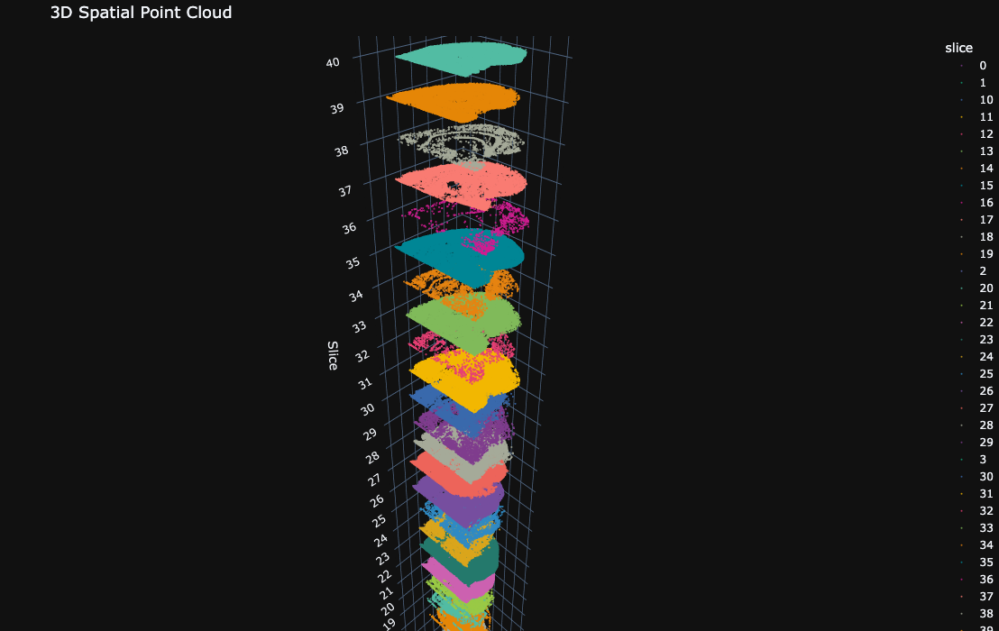

In [8]:
import sys
import numpy as np
import anndata as ad
import plotly.graph_objects as go
import plotly.express as px


def plot_3d_pointcloud(
    adata: ad.AnnData,
    spatial_key: str = "spatial",
    slice_key: str = "slice",
    z_spacing: float = 1.0,
    point_size: float = 1.5,
    opacity: float = 0.8,
    color_by: str | None = None,
    title: str = "3D Spatial Point Cloud",
) -> go.Figure:
    xy = np.array(adata.obsm[spatial_key])[:, :2]
    slices = adata.obs[slice_key]

    # Build numeric z from slice labels
    unique_slices = sorted(slices.unique(), key=lambda s: (float(s) if str(s).replace(".", "").replace("-", "").isdigit() else 0, str(s)))
    slice_to_z = {s: i * z_spacing for i, s in enumerate(unique_slices)}
    z = np.array([slice_to_z[s] for s in slices])

    color_col = color_by if color_by else slice_key
    color_vals = adata.obs[color_col].astype(str).values

    fig = go.Figure()

    unique_colors = sorted(set(color_vals))
    palette = px.colors.qualitative.Bold + px.colors.qualitative.Vivid
    color_map = {v: palette[i % len(palette)] for i, v in enumerate(unique_colors)}

    for val in unique_colors:
        mask = color_vals == val
        fig.add_trace(go.Scatter3d(
            x=xy[mask, 0],
            y=xy[mask, 1],
            z=z[mask],
            mode="markers",
            marker=dict(size=point_size, opacity=opacity, color=color_map[val]),
            name=str(val),
            hovertemplate=(
                "x: %{x:.1f}<br>y: %{y:.1f}<br>"
                f"{slice_key}: {val}<br>"
                "<extra></extra>"
            ),
        ))

    fig.update_layout(
        title=dict(text=title, font=dict(size=18)),
        scene=dict(
            xaxis_title="Spatial X",
            yaxis_title="Spatial Y",
            zaxis_title="Slice",
            zaxis=dict(
                tickvals=[slice_to_z[s] for s in unique_slices],
                ticktext=[str(s) for s in unique_slices],
            ),
            aspectmode="data",
        ),
        legend_title=color_col,
        template="plotly_dark",
        margin=dict(l=0, r=0, t=40, b=0),
        width=900,
        height=700,
    )
    return fig

fig = plot_3d_pointcloud(adata, z_spacing=2.0, point_size=1.2)
fig.show()

In [7]:
# Define your target and reference slices using spatialLIBD's sample IDs
target_slice = 20
ref_slices = [21]

In [8]:
adata_target = adata[adata.obs["slice"] == target_slice].copy()
ref_list = []
for ref_id in ref_slices:
    adata_r = adata[adata.obs["slice"] == ref_id].copy()
    ref_list.append(adata_r)
adata_ref = ad.concat(ref_list)

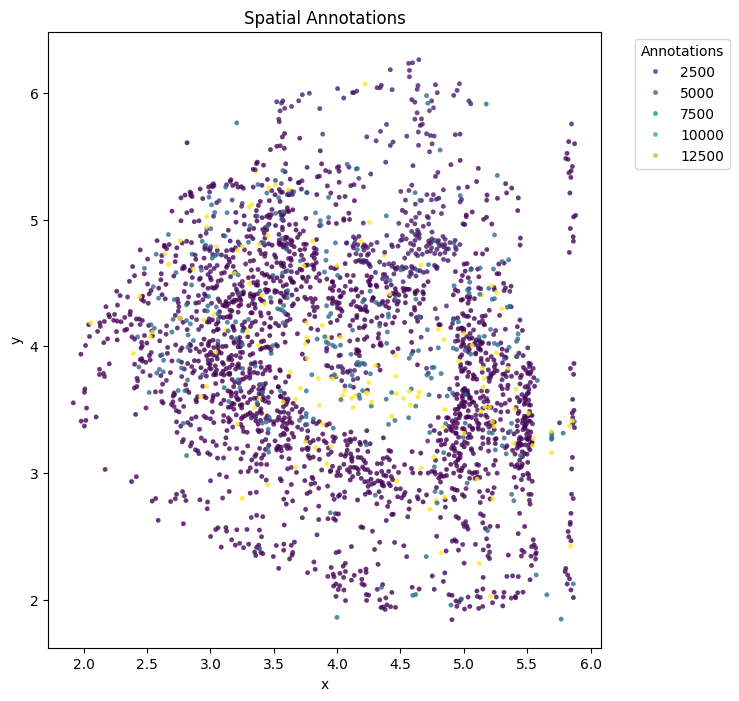

In [9]:
plot_df = pd.DataFrame(
    adata_target.obsm['spatial'], 
    columns=['x', 'y','z'], 
    index=adata_target.obs_names
)
plot_df['annotation'] = adata_target.obs['class']
plt.figure(figsize=(8, 8))
sns.scatterplot(
    data=plot_df,
    x='x',
    y='y',
    hue='annotation',
    palette='viridis',
    s=10,
    edgecolor=None,
    alpha=0.8
)
plt.gca().set_aspect('equal', adjustable='box') # Maintain spatial proportions
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Annotations')
plt.title('Spatial Annotations')
plt.show()

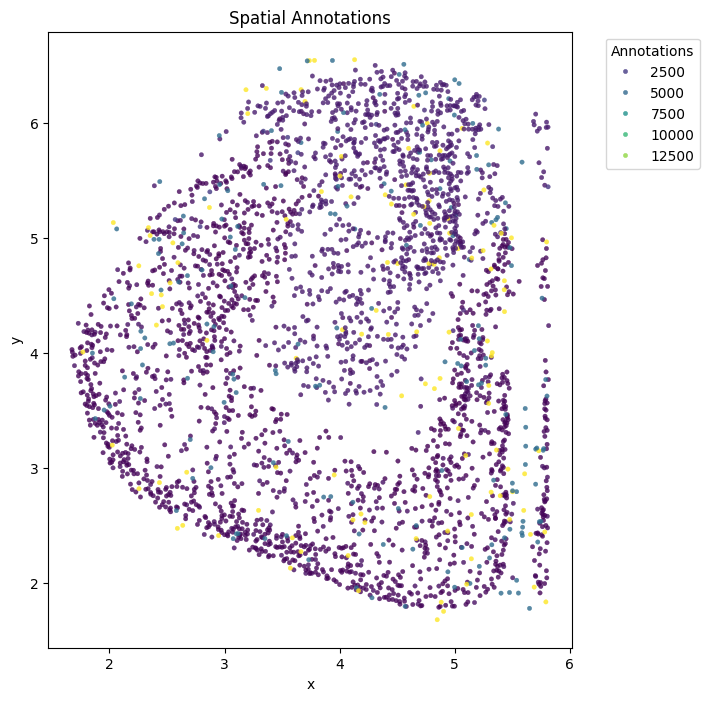

In [10]:
plot_df = pd.DataFrame(
    adata_ref.obsm['spatial'], 
    columns=['x', 'y','z'], 
    index=adata_ref.obs_names
)
plot_df['annotation'] = adata_ref.obs['class']
plt.figure(figsize=(8, 8))
sns.scatterplot(
    data=plot_df,
    x='x',
    y='y',
    hue='annotation',
    palette='viridis', 
    s=10,
    edgecolor=None,
    alpha=0.8
)
plt.gca().set_aspect('equal', adjustable='box') # Maintain spatial proportions
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Annotations')
plt.title('Spatial Annotations')
plt.show()

In [11]:
adata_target

AnnData object with n_obs × n_vars = 2651 × 100
    obs: 'brain_section_label', 'class', 'slice', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts'
    var: 'gene_symbol', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'
    obsm: 'spatial'
    layers: 'counts', 'logcounts'

In [15]:
if 'counts' in adata_target.layers:
    Y = adata_target.layers['counts']
else:
    Y = adata_target.X

T_target = adata_target.obsm['spatial'][:, 0:2]

T_ref = adata_ref.obsm['spatial'][:, 0:2]

if 'counts' in adata_ref.layers:
    X_ref = adata_ref.layers['counts']
else:
    X_ref = adata_ref.X

gene_names = adata_target.var["gene_symbol"].values

In [ ]:
np.savetxt("data/Y_mouse.csv", Y.astype(int), delimiter=",")
np.savetxt("data/T_target_mouse.csv", T_target, delimiter=",")
np.savetxt("data/X_ref_mouse.csv", X_ref, delimiter=",")
np.savetxt("data/T_ref_mouse.csv", T_ref, delimiter=",")
np.savetxt("data/gene_names_mouse.csv", gene_names.astype(str), delimiter=",", fmt="%s")